# Annotation API design

1. [Describe annotation types](#Annotation-Types)
2. [Annotation spec](#Annotation-spec)
3. [Sample Rikai API](#Rikai-annotation-API)

## Annotation Types

### Image Annotations

#### Points
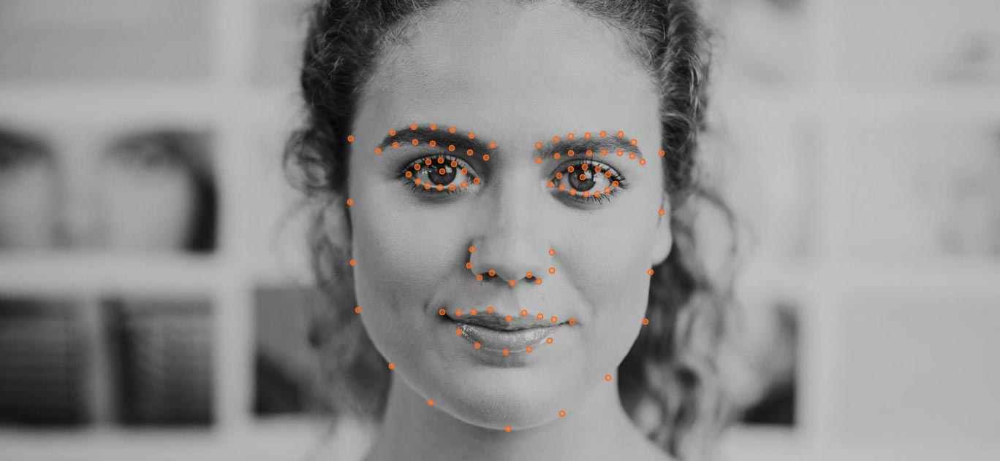

- Express as => [Point(x:double, y:double, z=None)]
- Visual attributes
  - size: int
  - color: (int, int, int)
  - border:
    - size: int
    - color: (int, int, int)

#### 2D bounding box
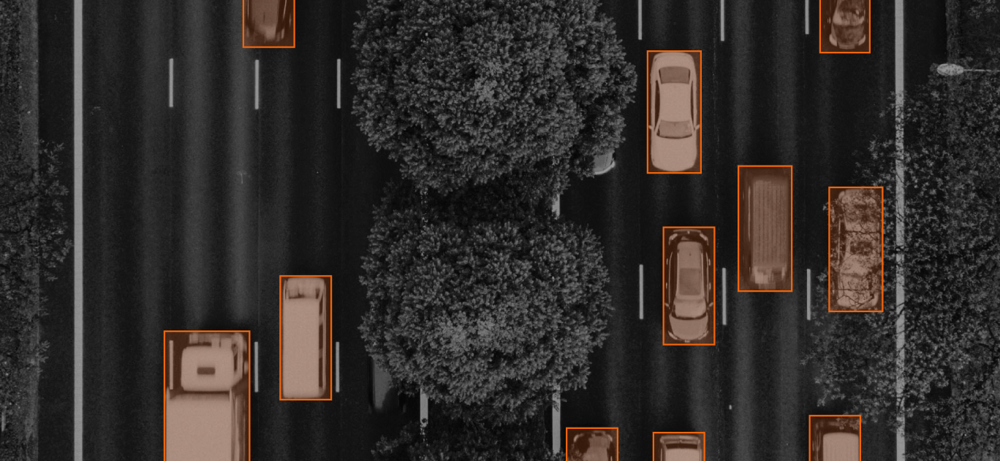

- Express as => Box2d(xmin, ymin, xmax, ymax)
- Visual attributes:
  - border
    - color: (int, int, int)
    - width: int
  - fill
    - color: (int, int, int)
    - transparency: double

#### 3D bounding box
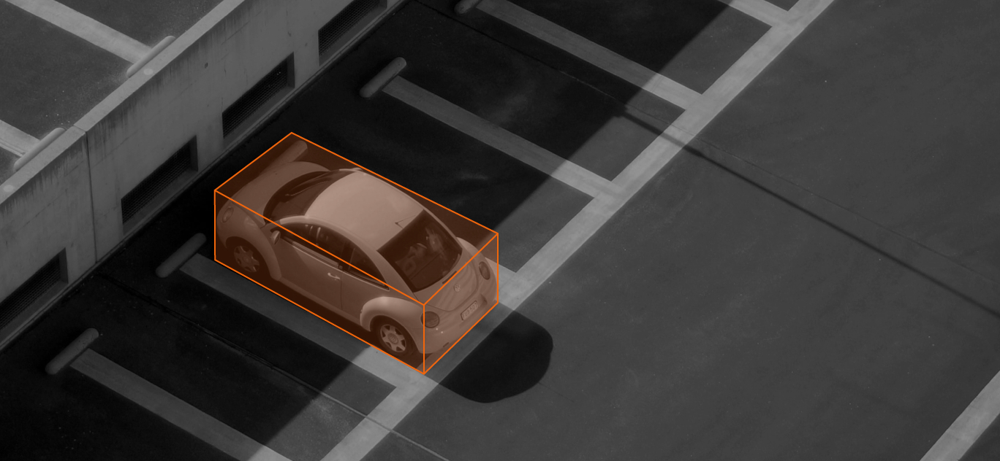

- Express as => Box3d(center, length, width, height, rotation)
- `center` is a 3d Point(x, y, z)
- Visual attributes:
  - border
    - color: (int, int, int)
    - width: int
  - fill
    - color: (int, int, int)
    - transparency: double

#### Label
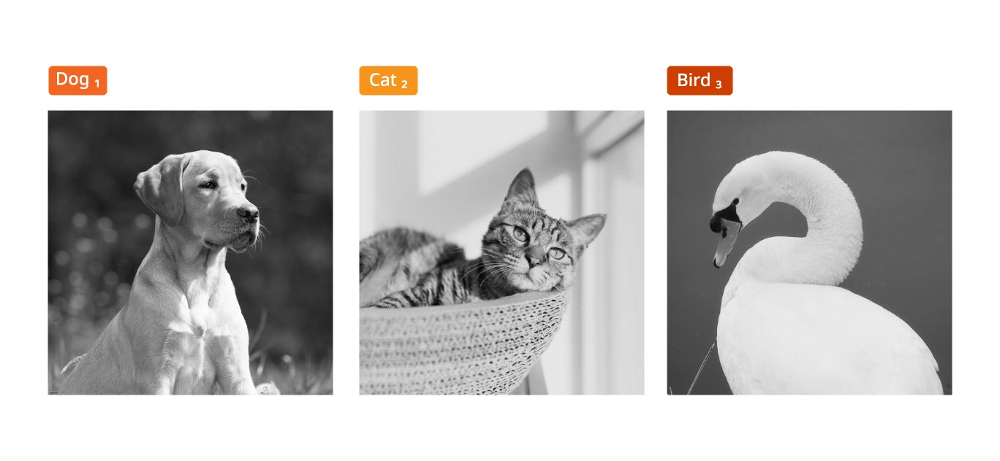

- Express as => Label(label: str, class: option[int])
- Visual attributes: 
  - bounding_box: Box2d
  - border
    - color: (int, int, int)
    - size: int
  - fill
    - color: (int, int, int)
    - transparency: double
  - font
    - size: int
    - color: (int, int, int)
    - valign: enum(top, center, bottom)
    - halign: enum(left, center, right)
  - show_class: bool

#### Lines and splines
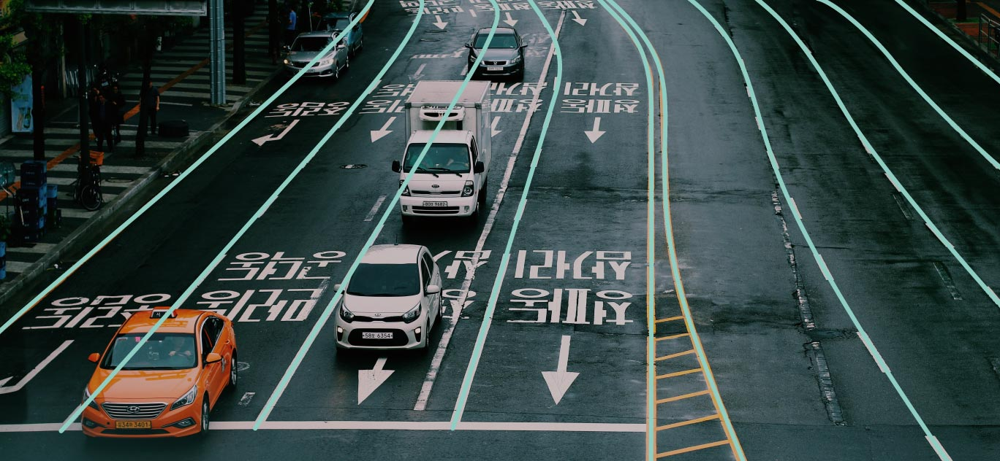

- Line => Line(Point1, Point2)
- Spline => Spline(Point1, Point2, Point3, ...)
- Visual attributes: 
  - color: (int, int, int)
  - width: int

#### Polygon
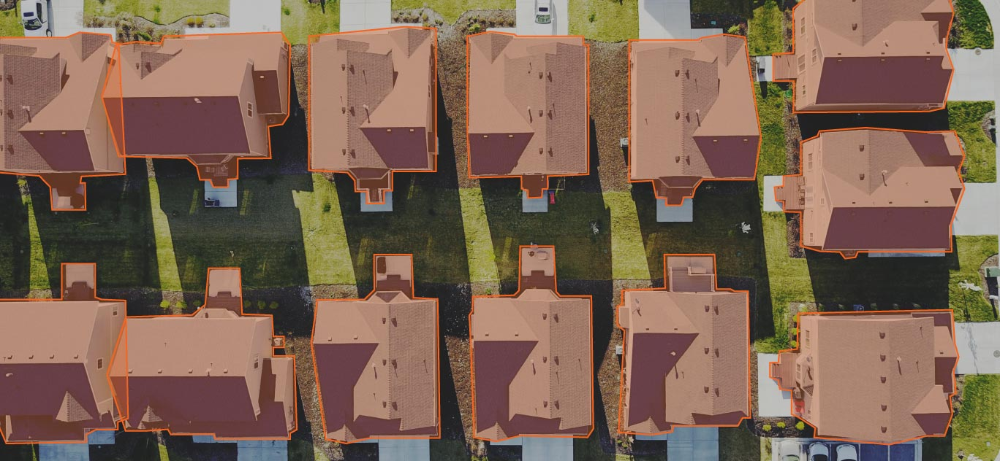

- Express as => Polygon(Point1, Point2, ...)
- Visual attributes:
  - border
    - color: (int, int, int)
    - width: int
  - fill
    - color: (int, int, int)
    - transparency: double
  - margin: int

#### Semantic Segmentation
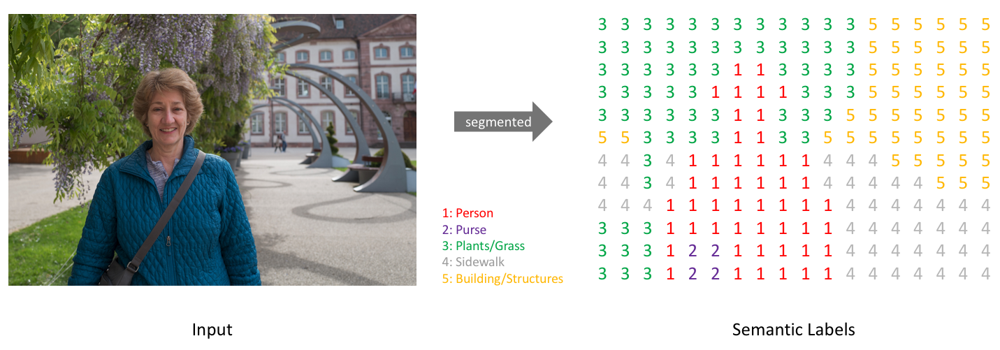

- Express as => Segmentation(segments: ndarray[int, int], labels: {int: Label})
- Visual attributes:
  - color: {int: (int, int, int)}

### Compound types

- Each of the shape annotations can be combined with a Label annotation
- Annotations can be grouped together so that their attributes/labels can be specified together

### Video Annotations

#### Video segment
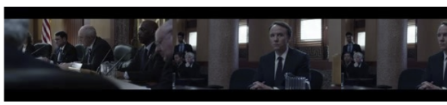

- Express as => VideoSegment(start_time:Time,end_time:Time)
- visual attributes:
  - width:int
  - height:int
  - num_frames:int

#### Cue point
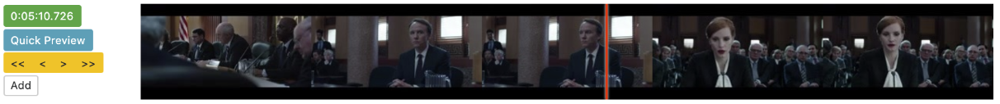

- Express as => CuePoint(time:Time)
- Visual attribues:
  - marker
    - color:(int,int,int)
    - size:int

#### Object Tracking
- Object tracking is a compound annotation type that involves following an object across multiple frames
- The object is marked with {point / box / polygon} annotations, with possibly a label

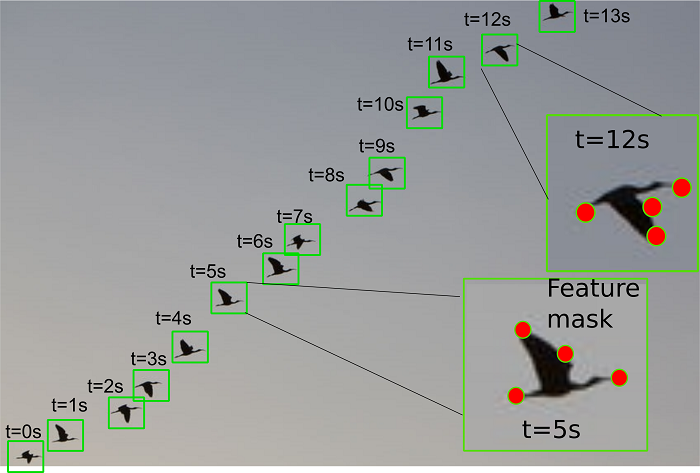

- Expressed as => TrackingAnnotation[T <: Annotation]([{time:Time -> image_annotation:T}])
- Visual attributes will be the same as for T

### Video semantic segmentation
- This basically is just matching the Segmentation annotations to each frame number you wish to annotate.

### Motion/Action detection
- While the semantic meaning is different, the annotations should be the same as object detection in videos

### Audio annotations

- Cue points and segments are similar to video segment (but no "frame" concept here)

## Annotation spec

We'll use a JSON format for serialization

```
{
  "data": {
    "type": <Enum("audio" | "video" | "image")>
    "uri": <str>
    "values": <ndarray>  # note that `uri` and `values` are not both required
  }
  "annotations": [
    {
      "type": "box2d"
      "parameters": {
        "xmin": <double>
        "ymin": <double>
        "xmax": <double>
        "ymax": <double>
      }
      "config": {
        "border": {
           "width": <int>
           "color": <Color>
           "type": <Enum("solid", "dashed", "dotted")>
        }
        "fill": {
          "color": <Color>
          "transparency": <double>
        }
      }
    }
  ]
}
```

## Rikai annotation API

### Combine image/video with annotations

Image + Annotation => AnnotatedImage

Image + [Annotation] => AnnotatedImage

AnnotatedImage.to_image(uri:str) => Image(uri:str)

AnnotatedImage.to_image() => Image(data:ndarray)

AnnotatedImage.to_spec() => AnnotatedImageSpec # spec details below

### AnnotatedImage can be visualized in jupyter notebook via `to_image`

### Also add spark functions to combine columns of Image/Video with annotations

e.g., `rikai_df.select(annotate($image, $bounding_box))`

### Scaling, translation, and other geometric/affine transformations should preserve annotations

e.g., AnnotatedImage.scale(width, height) should also affect the Annotations properly

...and so on for all types